# VIDEO 2

In [1]:
import pandas as pd
import matplotlib

file_path = 'C:/Users/beto.primi/Downloads/microdados_enem2017/Microdados Enem 2017/DADOS/MICRODADOS_ENEM_2017.csv'
encoding = 'ISO-8859-1'
sep = ';'

In [5]:
enem_columns = pd.read_csv(
    file_path,
    sep=sep, 
    encoding=encoding,
    nrows=1,
)

In [6]:
enem_columns.columns.values

array(['NU_INSCRICAO', 'NU_ANO', 'CO_MUNICIPIO_RESIDENCIA',
       'NO_MUNICIPIO_RESIDENCIA', 'CO_UF_RESIDENCIA', 'SG_UF_RESIDENCIA',
       'NU_IDADE', 'TP_SEXO', 'TP_ESTADO_CIVIL', 'TP_COR_RACA',
       'TP_NACIONALIDADE', 'CO_MUNICIPIO_NASCIMENTO',
       'NO_MUNICIPIO_NASCIMENTO', 'CO_UF_NASCIMENTO', 'SG_UF_NASCIMENTO',
       'TP_ST_CONCLUSAO', 'TP_ANO_CONCLUIU', 'TP_ESCOLA', 'TP_ENSINO',
       'IN_TREINEIRO', 'CO_ESCOLA', 'CO_MUNICIPIO_ESC',
       'NO_MUNICIPIO_ESC', 'CO_UF_ESC', 'SG_UF_ESC',
       'TP_DEPENDENCIA_ADM_ESC', 'TP_LOCALIZACAO_ESC', 'TP_SIT_FUNC_ESC',
       'IN_BAIXA_VISAO', 'IN_CEGUEIRA', 'IN_SURDEZ',
       'IN_DEFICIENCIA_AUDITIVA', 'IN_SURDO_CEGUEIRA',
       'IN_DEFICIENCIA_FISICA', 'IN_DEFICIENCIA_MENTAL',
       'IN_DEFICIT_ATENCAO', 'IN_DISLEXIA', 'IN_DISCALCULIA',
       'IN_AUTISMO', 'IN_VISAO_MONOCULAR', 'IN_OUTRA_DEF', 'IN_GESTANTE',
       'IN_LACTANTE', 'IN_IDOSO', 'IN_ESTUDA_CLASSE_HOSPITALAR',
       'IN_SEM_RECURSO', 'IN_BRAILLE', 'IN_AMPLIADA_24

In [8]:
enem_data = pd.read_csv(
    file_path,
    sep=sep, 
    encoding=encoding,
    usecols=['NO_MUNICIPIO_RESIDENCIA', 'SG_UF_RESIDENCIA', 'NU_IDADE', 'TP_SEXO', 'IN_GESTANTE']
)

In [9]:
enem_data.head()

,NO_MUNICIPIO_RESIDENCIA,SG_UF_RESIDENCIA,NU_IDADE,TP_SEXO,IN_GESTANTE
0,Araraquara,SP,29.0,F,0
1,Cassilândia,MS,22.0,F,0
2,São Paulo,SP,38.0,F,0
3,Lages,SC,35.0,F,0
4,Maceió,AL,40.0,M,0


In [10]:
enem_data['NO_MUNICIPIO_RESIDENCIA'].value_counts()

São Paulo          325915
Rio de Janeiro     175037
Fortaleza          123968
Brasília           123169
Salvador           121063
                    ...  
Major Gercino          14
Linha Nova             13
Doutor Pedrinho        11
Canudos do Vale         9
Paial                   7
Name: NO_MUNICIPIO_RESIDENCIA, Length: 5298, dtype: int64

In [11]:
enem_data['NU_IDADE'].value_counts().sort_index()

10.0       7
11.0       9
12.0      39
13.0     362
14.0    6820
        ... 
85.0       3
86.0       2
88.0       4
89.0       1
90.0       1
Name: NU_IDADE, Length: 80, dtype: int64

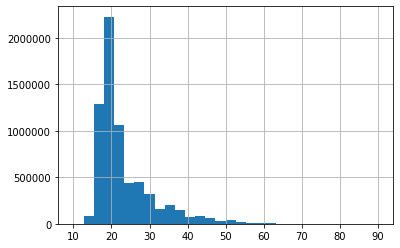

In [12]:
enem_data['NU_IDADE'].hist(bins=30)

In [13]:
enem_data['SG_UF_RESIDENCIA'].value_counts()

SP    1133824
MG     731308
BA     493468
RJ     439114
PE     367435
CE     366345
PA     356845
RS     294973
MA     287971
PR     287271
GO     219996
PB     189876
AM     165171
RN     159076
PI     147553
ES     137531
SC     127087
MT     126254
DF     123169
AL     121049
MS      92198
SE      90271
RO      80433
TO      68397
AC      53659
AP      50852
RR      20215
Name: SG_UF_RESIDENCIA, dtype: int64

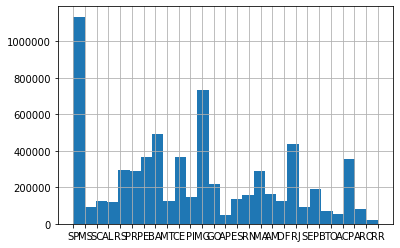

In [14]:
enem_data['SG_UF_RESIDENCIA'].hist(bins=27)

In [15]:
distInGest = enem_data['IN_GESTANTE'].value_counts()

In [16]:
[100*dist/distInGest.sum() for dist in distInGest]

[99.96043878923976, 0.03956121076023336]

In [17]:
distTpSexo = enem_data['TP_SEXO'].value_counts()

In [18]:
distTpSexo

F    3946756
M    2784585
Name: TP_SEXO, dtype: int64

In [19]:
[100*dist/distTpSexo.sum() for dist in distTpSexo]

[58.63253696403139, 41.36746303596861]

In [20]:
100*distInGest[1]/distTpSexo[0]

0.06747313489863574

In [21]:
100 - 100*distInGest[1]/distTpSexo[0]

99.93252686510137

# VIDEO 3

In [22]:
enem_data_redacao = pd.read_csv(
    file_path,
    sep=sep, 
    encoding=encoding,
    usecols=['TP_SEXO', 'NU_NOTA_REDACAO']
)

In [24]:
enem_data_redacao = enem_data_redacao.dropna()

In [25]:
enem_data_redacao.head()

,TP_SEXO,NU_NOTA_REDACAO
0,F,560.0
3,F,580.0
4,M,580.0
5,F,540.0
6,M,400.0


In [26]:
enem_data_redacao.groupby('TP_SEXO').count()

,NU_NOTA_REDACAO
TP_SEXO,
F,2751456
M,1949972


In [27]:
enem_data_redacao.groupby('TP_SEXO').max()

,NU_NOTA_REDACAO
TP_SEXO,
F,1000.0
M,1000.0


In [28]:
enem_data_redacao.groupby('TP_SEXO').min()

,NU_NOTA_REDACAO
TP_SEXO,
F,0.0
M,0.0


In [29]:
enem_data_redacao.query('NU_NOTA_REDACAO > 0').groupby('TP_SEXO').min()

,NU_NOTA_REDACAO
TP_SEXO,
F,40.0
M,40.0


In [30]:
enem_data_redacao[enem_data_redacao.NU_NOTA_REDACAO > 0].groupby('TP_SEXO').min()

,NU_NOTA_REDACAO
TP_SEXO,
F,40.0
M,40.0


In [33]:
enem_data_redacao[enem_data_redacao.NU_NOTA_REDACAO > 0].groupby('TP_SEXO').mean()

,NU_NOTA_REDACAO
TP_SEXO,
F,566.346673
M,547.453756


In [34]:
enem_data_redacao[enem_data_redacao.NU_NOTA_REDACAO > 0].groupby('TP_SEXO').median()

,NU_NOTA_REDACAO
TP_SEXO,
F,560.0
M,540.0


TP_SEXO
F    [[AxesSubplot(0.125,0.125;0.775x0.755)]]
M    [[AxesSubplot(0.125,0.125;0.775x0.755)]]
dtype: object

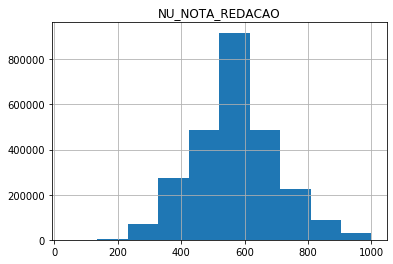

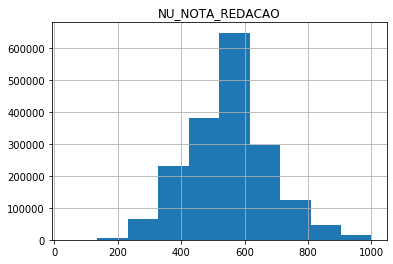

In [35]:
enem_data_redacao[enem_data_redacao.NU_NOTA_REDACAO > 0].groupby('TP_SEXO').hist()

In [37]:
enem_data_redacao[enem_data_redacao.NU_NOTA_REDACAO > 0].groupby('TP_SEXO').describe()

NU_NOTA_REDACAO                                                     \
                  count        mean         std   min    25%    50%    75%   
TP_SEXO                                                                      
F             2583946.0  566.346673  130.477212  40.0  480.0  560.0  640.0   
M             1814508.0  547.453756  127.960255  40.0  460.0  540.0  620.0   

                 
            max  
TP_SEXO          
F        1000.0  
M        1000.0

F         AxesSubplot(0.1,0.15;0.363636x0.75)
M    AxesSubplot(0.536364,0.15;0.363636x0.75)
dtype: object

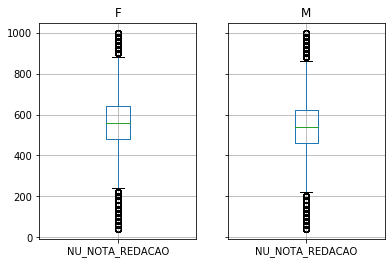

In [38]:
enem_data_redacao[enem_data_redacao.NU_NOTA_REDACAO > 0].groupby('TP_SEXO').boxplot()

# VIDEO 3

In [2]:
enem_data_sc = pd.read_csv(
    file_path, 
    sep=sep, 
    encoding=encoding,
    usecols=['NU_INSCRICAO', 'NU_NOTA_MT', 'NU_NOTA_REDACAO', 'Q001', 'Q002', 'SG_UF_RESIDENCIA']
)

enem_data_sc.head()

,NU_INSCRICAO,SG_UF_RESIDENCIA,NU_NOTA_MT,NU_NOTA_REDACAO,Q001,Q002
0,170003336736,SP,465.5,560.0,E,D
1,170003333545,MS,NaN,NaN,C,E
2,170001663644,SP,NaN,NaN,A,A
3,170001663645,SC,591.2,580.0,E,D
4,170001663646,AL,584.6,580.0,A,B


In [3]:
enem_data_sc = enem_data_sc.dropna()

In [70]:
enem_data_sc.head()

,NU_INSCRICAO,SG_UF_RESIDENCIA,NU_NOTA_MT,NU_NOTA_REDACAO,Q001,Q002
0,170003336736,SP,465.5,560.0,E,D
3,170001663645,SC,591.2,580.0,E,D
4,170001663646,AL,584.6,580.0,A,B
5,170001663647,RS,578.5,540.0,F,F
6,170003334115,PR,607.5,400.0,C,D


In [4]:
dictQuestoes = {
    'A': 'Nunca estudou',
    'B': 'Não completou 4º Serie',
    'C': 'Não completou 8º Serie',
    'D': 'Não completou Ensino médio',
    'E': 'Não completou faculdade',
    'F': 'Não completou pós-graduação',
    'G': 'Completou pós-graduação',
    'H': 'Não sei'
}

In [72]:
enem_data_sc.filter(items=['Q001', 'NU_INSCRICAO']).groupby('Q001').count()

,NU_INSCRICAO
Q001,
A,235500
B,949055
C,646907
D,545183
E,1139984
F,327234
G,190898
H,391994


In [5]:
enem_data_sc['NO_Q001'] = [dictQuestoes[resposta] for resposta in enem_data_sc['Q001']]

In [6]:
enem_data_sc['NO_Q002'] = [dictQuestoes[resposta] for resposta in enem_data_sc['Q002']]

In [75]:
enem_data_sc.filter(items=['NU_INSCRICAO', 'NO_Q001']).groupby(['NO_Q001']).count().sort_values(by='NU_INSCRICAO', ascending=False)

,NU_INSCRICAO
NO_Q001,
Não completou faculdade,1139984
Não completou 4º Serie,949055
Não completou 8º Serie,646907
Não completou Ensino médio,545183
Não sei,391994
Não completou pós-graduação,327234
Nunca estudou,235500
Completou pós-graduação,190898


In [76]:
enem_data_sc.filter(items=['NU_INSCRICAO', 'NO_Q002']).groupby(['NO_Q002']).count().sort_values(by='NU_INSCRICAO', ascending=False)

,NU_INSCRICAO
NO_Q002,
Não completou faculdade,1394384
Não completou 4º Serie,726066
Não completou 8º Serie,617825
Não completou Ensino médio,607488
Não completou pós-graduação,434249
Completou pós-graduação,331120
Nunca estudou,167615
Não sei,148008


In [77]:
enem_data_sc.filter(items=['NU_NOTA_MT', 'NO_Q001']).groupby(['NO_Q001']).mean().sort_values(by='NU_NOTA_MT', ascending=False)

,NU_NOTA_MT
NO_Q001,
Completou pós-graduação,616.893871
Não completou pós-graduação,593.391938
Não completou faculdade,536.116836
Não completou Ensino médio,514.601088
Não completou 8º Serie,505.262816
Não sei,494.258548
Não completou 4º Serie,487.199458
Nunca estudou,467.530549


In [78]:
enem_data_sc.filter(items=['NU_NOTA_MT', 'NO_Q002']).groupby(['NO_Q002']).mean().sort_values(by='NU_NOTA_MT', ascending=False)

,NU_NOTA_MT
NO_Q002,
Completou pós-graduação,591.093894
Não completou pós-graduação,578.223176
Não completou faculdade,527.230099
Não completou Ensino médio,505.978208
Não completou 8º Serie,498.199878
Não sei,486.001138
Não completou 4º Serie,482.164030
Nunca estudou,462.829182


In [79]:
enem_data_sc.filter(items=['NU_NOTA_REDACAO', 'NO_Q001']).groupby(['NO_Q001']).mean().sort_values(by='NU_NOTA_REDACAO', ascending=False)

,NU_NOTA_REDACAO
NO_Q001,
Completou pós-graduação,643.384530
Não completou pós-graduação,619.052788
Não completou faculdade,557.812601
Não completou Ensino médio,529.755477
Não completou 8º Serie,514.427514
Não sei,491.430481
Não completou 4º Serie,487.364926
Nunca estudou,447.571380


In [80]:
data = enem_data_sc.filter(items=['NU_NOTA_REDACAO', 'NO_Q002']).groupby(['NO_Q002']).mean().sort_values(by='NU_NOTA_REDACAO', ascending=False)

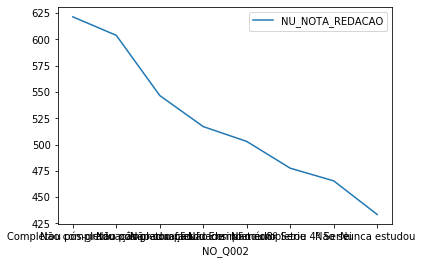

In [81]:
data.plot()

In [82]:
enem_data_sc.filter(items=['NU_NOTA_REDACAO', 'NO_Q002']).groupby(['NO_Q002']).describe()

NU_NOTA_REDACAO                               \
                                      count        mean         std  min   
NO_Q002                                                                    
Completou pós-graduação            331120.0  621.563904  169.419147  0.0   
Nunca estudou                      167615.0  433.458939  197.993119  0.0   
Não completou 4º Serie             726066.0  477.512926  181.877996  0.0   
Não completou 8º Serie             617825.0  502.994246  175.969516  0.0   
Não completou Ensino médio         607488.0  517.102461  172.387299  0.0   
Não completou faculdade           1394384.0  546.654881  170.863392  0.0   
Não completou pós-graduação        434249.0  603.939675  168.341801  0.0   
Não sei                            148008.0  465.484704  191.640904  0.0   

                                                          
                               25%    50%    75%     max  
NO_Q002                                                   
Completou pós-graduação      540.0  620.0  720.0  1000.0  
Nunca estudou                380.0  480.0  560.0  1000.0  
Não completou 4º Serie       420.0  520.0  580.0  1000.0  
Não completou 8º Serie       440.0  520.0  600.0   980.0  
Não completou Ensino médio   460.0  540.0  600.0  1000.0  
Não completou faculdade      480.0  560.0  640.0  1000.0  
Não completou pós-graduação  520.0  600.0  700.0  1000.0  
Não sei                      400.0  500.0  580.0   980.0

# Video 4

In [85]:
enem_data_sc\
    .filter(items=['NU_NOTA_REDACAO', 'NO_Q002'])\
    .where(enem_data_sc['SG_UF_RESIDENCIA'] == 'SP')\
    .groupby(['NO_Q002'])\
    .mean().sort_values(by='NU_NOTA_REDACAO', ascending=False)

,NU_NOTA_REDACAO
NO_Q002,
Completou pós-graduação,616.219004
Não completou pós-graduação,601.978557
Não completou faculdade,546.760892
Não completou Ensino médio,520.343983
Não completou 8º Serie,508.816499
Não completou 4º Serie,487.321112
Não sei,473.006817
Nunca estudou,439.126683


In [86]:
enem_data_sc\
    .filter(items=['NU_NOTA_REDACAO', 'NO_Q002'])\
    .where(enem_data_sc['SG_UF_RESIDENCIA'] == 'RJ')\
    .groupby(['NO_Q002'])\
    .mean().sort_values(by='NU_NOTA_REDACAO', ascending=False)

,NU_NOTA_REDACAO
NO_Q002,
Completou pós-graduação,656.917830
Não completou pós-graduação,635.894008
Não completou faculdade,564.676475
Não completou Ensino médio,531.177054
Não completou 8º Serie,515.840720
Não completou 4º Serie,491.689942
Não sei,488.632644
Nunca estudou,445.822237


In [88]:
enem_data_sc\
    .filter(items=['SG_UF_RESIDENCIA', 'NU_NOTA_REDACAO', 'NO_Q002'])\
    .groupby(['NO_Q002', 'SG_UF_RESIDENCIA'])\
    .mean().sort_values(by='NU_NOTA_REDACAO', ascending=False)

NU_NOTA_REDACAO
NO_Q002                 SG_UF_RESIDENCIA                 
Completou pós-graduação RJ                     656.917830
                        CE                     652.020171
                        DF                     645.128037
                        MG                     643.924246
                        SE                     643.382508
...                                                   ...
Nunca estudou           TO                     408.596112
                        MA                     408.034580
                        AM                     397.774094
                        RR                     394.049587
                        MT                     393.549465

[216 rows x 1 columns]

In [89]:
import matplotlib.pyplot as plt

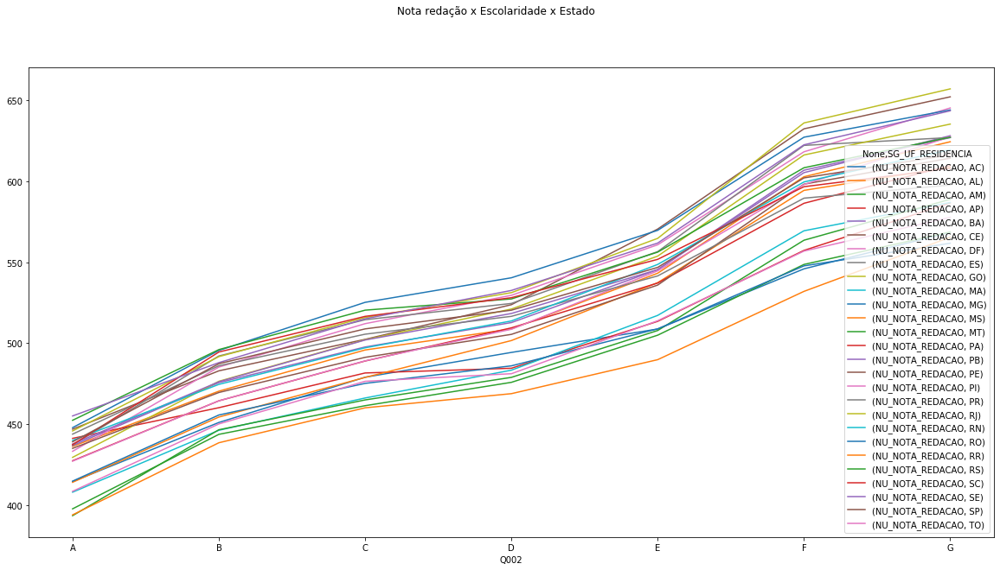

In [105]:
fig, ax = plt.subplots(figsize=(20,10))
plt.suptitle('Nota redação x Escolaridade x Estado')

enem_data_sc\
    .filter(items=['SG_UF_RESIDENCIA', 'NU_NOTA_REDACAO', 'Q002'])\
    .query('Q002 != "H"')\
    .groupby(['Q002', 'SG_UF_RESIDENCIA'])\
    .mean().sort_values(by='NU_NOTA_REDACAO', ascending=False)\
    .unstack().plot(ax=ax)

# VIDEO 6

In [8]:
import matplotlib.pyplot as plt

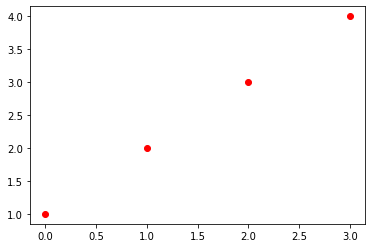

In [5]:
plt.plot([1,2,3,4], "ro")
plt.show()

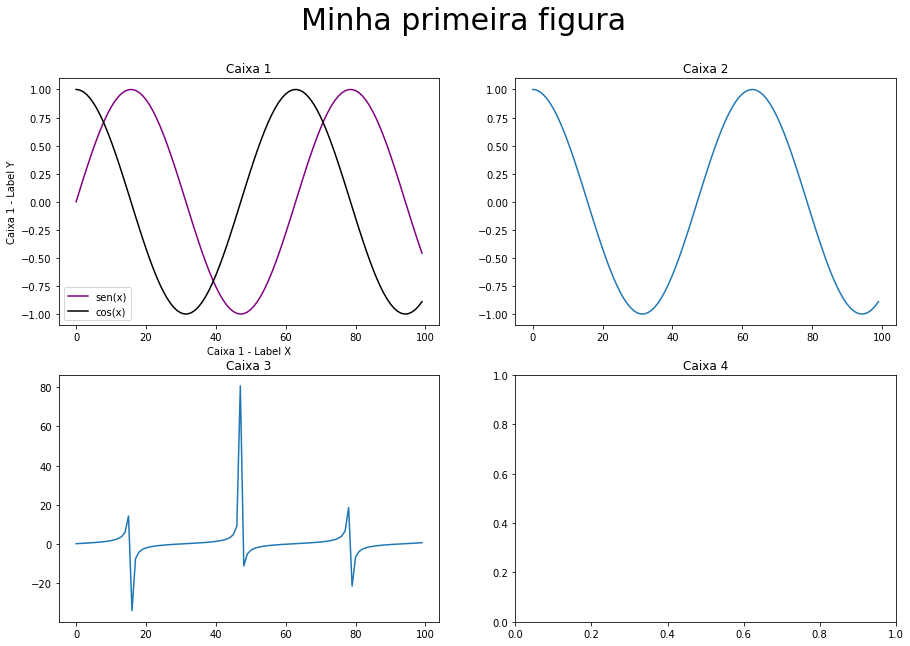

In [31]:
import numpy as np

x = np.arange(0, 10, 0.1)

fig1, f1_axes = plt.subplots(ncols=2, nrows=2, figsize=(15,10))

fig1.suptitle('Minha primeira figura', size=30)

f1_axes[0,0].set_title('Caixa 1')
f1_axes[0,1].set_title('Caixa 2')
f1_axes[1,0].set_title('Caixa 3')
f1_axes[1,1].set_title('Caixa 4')

f1_axes[0,0].set_xlabel('Caixa 1 - Label X')
f1_axes[0,0].set_ylabel('Caixa 1 - Label Y')

f1_axes[0,0].plot(np.sin(x), label='sen(x)', color='purple')
f1_axes[0, 0].plot(np.cos(x), label='cos(x)', color='#000000')
f1_axes[0, 0].legend()

f1_axes[0, 1].plot(np.cos(x))
f1_axes[1, 0].plot(np.tan(x))

# VIDEO 6

Text(0.05, 0.6, 'A : Nunca estudou\nB : Não completou 4º Serie\nC : Não completou 8º Serie\nD : Não completou Ensino médio\nE : Não completou faculdade\nF : Não completou pós-graduação\nG : Completou pós-graduação\nH : Não sei\n')

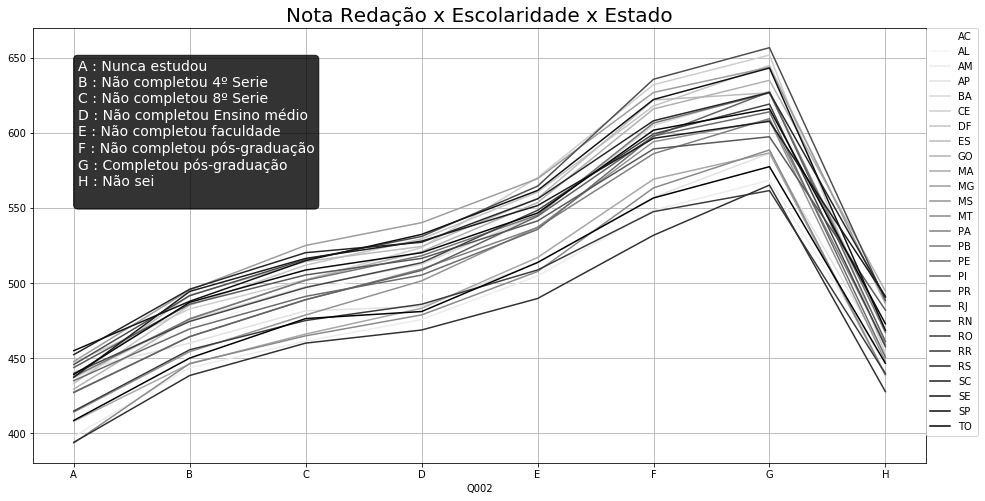

In [36]:
import re

ax = enem_data_sc\
    .filter(items=['SG_UF_RESIDENCIA', 'NU_NOTA_REDACAO', 'Q002'])\
    .groupby(['Q002', 'SG_UF_RESIDENCIA'])\
    .mean().sort_values(by='NU_NOTA_REDACAO', ascending=False)\
    .unstack().plot(figsize=(16, 8), colormap='binary', grid=True)

ax.set_title('Nota Redação x Escolaridade x Estado', fontsize=20)

handles, labels = ax.get_legend_handles_labels()
edited_labels = [re.search(',\s(.+?)\)', label).group(1) for label in labels]
ax.legend(edited_labels, bbox_to_anchor=(1, 1), loc=0, borderaxespad=0.)

text_q002 = ''

for key, value in dictQuestoes.items():
    text_q002 += '{key} : {value}\n'.format(key=key, value=value)

ax.text(0.05, 0.6, text_q002, transform=ax.transAxes, fontsize=14, color='white', bbox={'boxstyle': 'round', 'facecolor': 'black', 'alpha': 0.8})